In [ ]:
# conda install -c conda-forge cartopy

In [ ]:
# !pip install pandas
# !pip install numpy
# !pip install math
# !pip install statsmodels
# !pip install matplotlib
# !pip install --upgrade matplotlib
# !pip install seaborn
# !pip install itertools
# !pip install scipy
# !pip install pyarrow
# !pip install sklearn
# !pip install nltk
# !pip install catboost
# !pip install hyperopt
# !pip install xgboost
# !pip install lightgbm

!pip install bds_courseware
!pip install pandas-profiling==3.4.0
!pip install --upgrade scikit-learn
!pip install cartopy
!pip install pyclustering
!pip install geopy

     ---------------------------------------- 7.2/7.2 MB 5.1 MB/s eta 0:00:00


In [ ]:
from bds_courseware import read_drive_dataset
from bds_courseware import print_dataset_description, print_module_datasets
from bds_courseware import HOMEWORK_DATASETS

from sklearn.impute import SimpleImputer
from sklearn.impute import MissingIndicator
from sklearn.experimental import enable_iterative_imputer
from sklearn.impute import IterativeImputer

from sklearn.preprocessing import StandardScaler, Normalizer
from sklearn.preprocessing import MinMaxScaler

from sklearn.pipeline import Pipeline, FeatureUnion
from sklearn.compose import ColumnTransformer
from sklearn.base import BaseEstimator, TransformerMixin
from sklearn.feature_selection import VarianceThreshold
from hyperopt import hp, fmin, tpe, Trials, STATUS_OK
from sklearn import metrics

import pandas_profiling
import pandas as pd
import numpy as np
import math
import statsmodels.api as sm
import matplotlib.pyplot as plt
import seaborn as sns
from itertools import product
import scipy.stats as ss
from scipy.stats import chi2
from scipy.spatial.distance import pdist, mahalanobis, squareform
import matplotlib.pyplot as plt
import matplotlib.cm as cm
import cartopy.crs as ccrs
import plotly.express as px
import plotly

from sklearn.cluster import KMeans
from sklearn.cluster import DBSCAN
from sklearn.cluster import OPTICS
from sklearn.cluster import AgglomerativeClustering
from scipy.cluster.hierarchy import dendrogram
from sklearn.metrics import silhouette_samples, silhouette_score
from sklearn.metrics import davies_bouldin_score, calinski_harabasz_score
from sklearn.decomposition import PCA, TruncatedSVD, NMF
from sklearn import set_config

from pyclustering.cluster.kmeans import kmeans
from pyclustering.cluster.dbscan import dbscan
from pyclustering.utils.metric import type_metric, distance_metric
from pyclustering.cluster.center_initializer import kmeans_plusplus_initializer
from pyclustering.cluster.encoder import type_encoding, cluster_encoder
from pyclustering.cluster.center_initializer import random_center_initializer
from pyclustering.cluster.center_initializer import kmeans_plusplus_initializer
import geopy.distance

import sys

import warnings
warnings.simplefilter("ignore")

seed = 42

# 1. Data Preparation

In [ ]:
name = "quake"
data = read_drive_dataset(*HOMEWORK_DATASETS[name])
print(data.head())

   Focal depth  Latitude  Longitude  Richter
0           33    -52.26      28.30      6.7
1           36     45.53     150.93      5.8
2           57     41.85     142.78      5.8
3           67     29.19     141.15      6.2
4           30    -21.66     169.81      6.0


In [ ]:
print(data.shape)
print(data.dtypes.value_counts())
print(data.dtypes)

(2178, 4)
float64    3
int64      1
dtype: int64
Focal depth      int64
Latitude       float64
Longitude      float64
Richter        float64
dtype: object


In [ ]:
print(data.isnull().sum())

Focal depth    0
Latitude       0
Longitude      0
Richter        0
dtype: int64


No missing values.

# 2. EDA

In [ ]:
report = pandas_profiling.ProfileReport(data)

In [ ]:
report

Summarize dataset:   0%|          | 0/5 [00:00<?, ?it/s]

Generate report structure:   0%|          | 0/1 [00:00<?, ?it/s]

Render HTML:   0%|          | 0/1 [00:00<?, ?it/s]

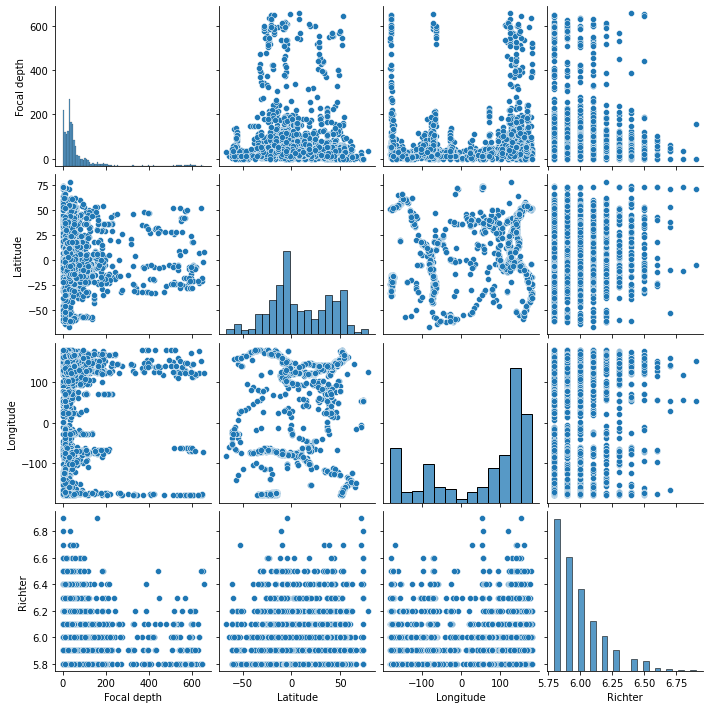

In [ ]:
pairwise_plots = sns.pairplot(data)

<AxesSubplot:>

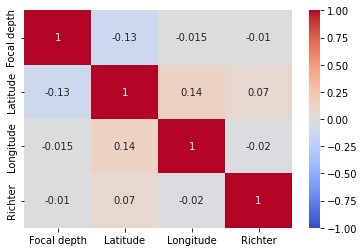

In [ ]:
corr = data.corr()
sns.heatmap(corr, cmap="coolwarm", vmin=-1, vmax=1, annot=True)

## Feature Engineering

For Richter scale each increase of one unit on the scale represents a 10-fold increase in the magnitude of an earthquake. So I will use the exponent of richter scale to represent the magnitude.

In [ ]:
data["Magnitude"] = data["Richter"].apply(lambda x: 10**x)

In [ ]:
data.describe(include="all")

,Focal depth,Latitude,Longitude,Richter,Magnitude
count,2178.000000,2178.000000,2178.000000,2178.000000,2.178000e+03
mean,74.359963,7.961997,54.914835,5.977181,1.064780e+06
std,116.467797,30.545583,118.875581,0.189426,6.586111e+05
min,0.000000,-66.490000,-179.960000,5.800000,6.309573e+05
25%,21.000000,-12.432500,-67.782500,5.800000,6.309573e+05
50%,39.000000,0.210000,122.100000,5.900000,7.943282e+05
75%,68.000000,36.480000,146.860000,6.100000,1.258925e+06
max,656.000000,78.150000,180.000000,6.900000,7.943282e+06


# 3. Normalization

Maybe I will use minmax scaling for the depth and magnitude columns maybe those transformations will also be useful later, as I think I should rather use the data as it was and rather work on the metric of distance as we are using coordinates.

In [ ]:
coord_features = ["Latitude", "Longitude"]
rd_features = ["Focal depth", "Richter", "Magnitude"]

In [ ]:
set_config(transform_output="pandas")
coord_pipe = Pipeline([
    ('scaler', StandardScaler())
])

rd_pipe = Pipeline([
    ('scaler', MinMaxScaler())
    # robust scaler
    # sugar_scaled
])

pipe = ColumnTransformer(transformers=[
    ('st', coord_pipe, coord_features),
    ('sc', rd_pipe, rd_features),
])

In [ ]:
data_tr = pipe.fit_transform(data)

In [ ]:
data_tr.describe(include="all")

,st__Latitude,st__Longitude,sc__Focal depth,sc__Richter,sc__Magnitude
count,2.178000e+03,2.178000e+03,2178.000000,2178.000000,2178.000000
mean,-2.003295e-17,-4.281852e-17,0.113354,0.161074,0.059328
std,1.000230e+00,1.000230e+00,0.177542,0.172206,0.090069
min,-2.437966e+00,-1.976258e+00,0.000000,0.000000,0.000000
25%,-6.678275e-01,-1.032386e+00,0.032012,0.000000,0.000000
50%,-2.538428e-01,5.653019e-01,0.059451,0.090909,0.022342
75%,9.338356e-01,7.736348e-01,0.103659,0.272727,0.085878
max,2.298340e+00,1.052478e+00,1.000000,1.000000,1.000000


In [ ]:
main_cols = ["Latitude", "Longitude", "Focal depth", "Richter"]
main_cols_tr = ["st__Latitude", "st__Longitude", "sc__Focal depth", "sc__Richter"]

# 4. Base Model

## 4.1 K-Means with normalized data

### Basic K-Means

In [ ]:
km_clt = KMeans(n_init="auto", random_state=seed)
cluster_labels = km_clt.fit_predict(data_tr[main_cols_tr])

silhouette_sc = silhouette_score(data_tr[main_cols_tr], cluster_labels)
db_sc = davies_bouldin_score(data_tr[main_cols_tr], cluster_labels)
ch_sc = calinski_harabasz_score(data_tr[main_cols_tr], cluster_labels)
print(
    "For base K-Means",
    "\nThe metrics are",
    "\nSilhouette score is :", silhouette_sc,
    "\nDavies Bouldin score is :", db_sc,
    "\nCalinski Harabasz score is :", ch_sc
)

For base K-Means 
The metrics are 
Silhouette score is : 0.4614231100485831 
Davies Bouldin score is : 0.7756766686145551 
Calinski Harabasz score is : 2647.7875029153424


### K-Means with 15 clusters

In [ ]:
km15_clt = KMeans(n_clusters=15, n_init="auto", random_state=seed)
cluster_labels = km15_clt.fit_predict(data_tr[main_cols_tr])

silhouette_sc = silhouette_score(data_tr[main_cols_tr], cluster_labels)
db_sc = davies_bouldin_score(data_tr[main_cols_tr], cluster_labels)
ch_sc = calinski_harabasz_score(data_tr[main_cols_tr], cluster_labels)
print(
    "For K-Means with 15 clusters",
    "\nThe metrics are",
    "\nSilhouette score is :", silhouette_sc,
    "\nDavies Bouldin score is :", db_sc,
    "\nCalinski Harabasz score is :", ch_sc
)

For K-Means with 15 clusters 
The metrics are 
Silhouette score is : 0.3793516331244585 
Davies Bouldin score is : 0.9362918013495419 
Calinski Harabasz score is : 2549.550369240348


### Finding the optimal K

In [ ]:
Sum_of_squared_distances = []
K = range(2,21)
for k in K:
    km = KMeans(n_clusters=k, n_init="auto", random_state=seed)
    km = km.fit(data_tr[main_cols_tr])
    Sum_of_squared_distances.append(km.inertia_)

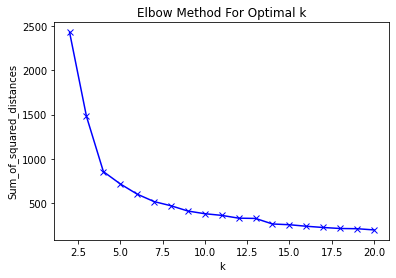

In [ ]:
plt.plot(K, Sum_of_squared_distances, 'bx-')
plt.xlabel('k')
plt.ylabel('Sum_of_squared_distances')
plt.title('Elbow Method For Optimal k')
plt.show()

Judging by eye, I think we can see the elbow point at 3 means and maybe at 7. Thus further I will use both to compare and find the optimal number of centroids.

### Hyperparameter Tuning

In [ ]:
%%time

def objective(space):
    params = {
        "n_clusters": int(space["n_clusters"]),
        "tol": float('{:.5f}'.format(space["tol"]))
    }

    km_clt = KMeans(
        n_init="auto",
        random_state=seed,
        **params
    )

    score = silhouette_score(data_tr[main_cols_tr], km_clt.fit_predict(data_tr[main_cols_tr]))
    print("Silhouette Score {:.3f} params {}".format(score, params))
    return {'loss':1 - score, 'status': STATUS_OK }

space = {
    "n_clusters": hp.choice("n_clusters", range(3, 10, 1)),
    "tol": hp.uniform("tol", 0.0001, 0.001)
    }

best = fmin(fn=objective,
            space=space,
            algo=tpe.suggest,
            max_evals=10)

Silhouette Score 0.540 params {'n_clusters': 6, 'tol': 0.00016}
Silhouette Score 0.533 params {'n_clusters': 5, 'tol': 0.00047}
Silhouette Score 0.533 params {'n_clusters': 5, 'tol': 0.00051}
Silhouette Score 0.540 params {'n_clusters': 6, 'tol': 0.0002}
Silhouette Score 0.461 params {'n_clusters': 8, 'tol': 0.00011}
Silhouette Score 0.461 params {'n_clusters': 8, 'tol': 0.0007}
Silhouette Score 0.540 params {'n_clusters': 6, 'tol': 0.00012}
Silhouette Score 0.545 params {'n_clusters': 4, 'tol': 0.00018}
Silhouette Score 0.545 params {'n_clusters': 4, 'tol': 0.00053}
Silhouette Score 0.500 params {'n_clusters': 3, 'tol': 0.00059}
100%|██████████| 10/10 [00:04<00:00,  2.24it/s, best loss: 0.45536707564566326]
CPU times: user 2.5 s, sys: 419 ms, total: 2.91 s
Wall time: 4.48 s


In [ ]:
# Checking n_clusters efficiencies
for n_clusters in K:
    clusterer = KMeans(n_clusters=n_clusters, n_init="auto", random_state=seed)
    cluster_labels = clusterer.fit_predict(data_tr[main_cols_tr])

    silhouette_avg = silhouette_score(data_tr[main_cols_tr], cluster_labels)
    print(
        "For n_clusters =",
        n_clusters,
        "The average silhouette_score is :",
        silhouette_avg,
    )

For n_clusters = 2 The average silhouette_score is : 0.49791535480326066
For n_clusters = 3 The average silhouette_score is : 0.499635006967274
For n_clusters = 4 The average silhouette_score is : 0.5446329243543367
For n_clusters = 5 The average silhouette_score is : 0.5334266910817055
For n_clusters = 6 The average silhouette_score is : 0.5398540751764287
For n_clusters = 7 The average silhouette_score is : 0.49254736691984885
For n_clusters = 8 The average silhouette_score is : 0.4614231100485831
For n_clusters = 9 The average silhouette_score is : 0.42072843080028455
For n_clusters = 10 The average silhouette_score is : 0.3544024252445362
For n_clusters = 11 The average silhouette_score is : 0.35132839481930556
For n_clusters = 12 The average silhouette_score is : 0.3614382960766837
For n_clusters = 13 The average silhouette_score is : 0.3358459062596434
For n_clusters = 14 The average silhouette_score is : 0.37604545782754234
For n_clusters = 15 The average silhouette_score is : 0

I think the optimal value is 4 or 6 given the elbow method and the silhouette scores combination. Thus, I will check both by visualizing the results to see which one of them performed better.

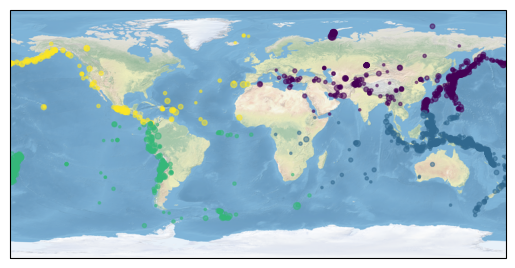

In [ ]:
km_opt_clt = KMeans(n_clusters=4, n_init="auto", random_state=seed, tol=0.00053)
km_opt_clt.fit(data_tr[main_cols_tr])
predicted_clusters = km_opt_clt.predict(data_tr[main_cols_tr])
ax = plt.axes(projection=ccrs.PlateCarree())
ax.stock_img()

plt.scatter(x=data.Longitude, y=data.Latitude,
            c=predicted_clusters,
            s=data_tr.sc__Richter*30,
            alpha=0.5,
            transform=ccrs.PlateCarree())
plt.show()

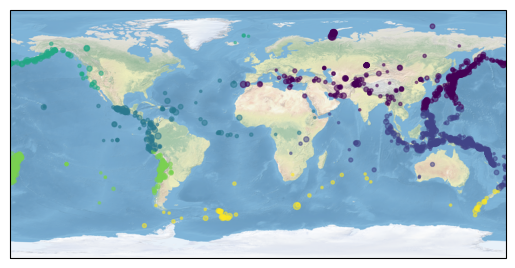

In [ ]:
km_opt_clt = KMeans(n_clusters=6, n_init="auto", random_state=seed, tol=0.0002)
km_opt_clt.fit(data_tr[main_cols_tr])
predicted_clusters = km_opt_clt.predict(data_tr[main_cols_tr])
ax = plt.axes(projection=ccrs.PlateCarree())
ax.stock_img()

plt.scatter(x=data.Longitude, y=data.Latitude,
            c=predicted_clusters,
            s=data_tr.sc__Richter*30,
            alpha=0.5,
            transform=ccrs.PlateCarree())
plt.show()

I believe the 6 cenroids K-Means performed better. Even though the use of the coordinates as just numbers stops it to see real distance between the earthquakes. So, we should switch to another metric. At the same time we can see that the data have a snakelike shape. Thus, I think the DBSCAN model will do a better job in learning the clusters, than a centroid method of K-Means. I will construct a metric myself to cover that issue in the "Other Models" section.

Here I will save the K-Means model results, later to use as true values to check the other models.

In [ ]:
km_opt_clt = KMeans(n_clusters=6, n_init="auto", random_state=seed, tol=0.0002)
km_opt_clt.fit(data_tr[main_cols_tr])
true_clusters = km_opt_clt.predict(data_tr[main_cols_tr])

# 5. Other Models

## 5.1 DBSCAN

In [ ]:
dbs_clt = DBSCAN()
cluster_labels = dbs_clt.fit_predict(data_tr[main_cols_tr])

silhouette_sc = silhouette_score(data_tr[main_cols_tr], cluster_labels)
db_sc = davies_bouldin_score(data_tr[main_cols_tr], cluster_labels)
ch_sc = calinski_harabasz_score(data_tr[main_cols_tr], cluster_labels)
print(
    "For base DBSCAN",
    "\nThe metrics are",
    "\nSilhouette score is :", silhouette_sc,
    "\nDavies Bouldin score is :", db_sc,
    "\nCalinski Harabasz score is :", ch_sc
)
print(f"Number of clusters: {len(np.unique(cluster_labels))}")

For base DBSCAN 
The metrics are 
Silhouette score is : 0.1801572120207715 
Davies Bouldin score is : 1.872932599955558 
Calinski Harabasz score is : 28.585809916031454
Number of clusters: 3


We can see that the silhouette score is quite low, and the base algorithm found only 3 clusters. Thus I will procced to hyperparameter tunning, and I will use the K-Means optimal algorithm results as ground truth, as mentioned in the homework.

### Hyperparameter Tuning Unlabeled

In [ ]:
%%time

def objective(space):
    params = {
        "min_samples": int(space["min_samples"]),
        "eps": float('{:.5f}'.format(space["eps"]))
    }

    dbs_clt = DBSCAN(
        **params
    )

    score = silhouette_score(data_tr[main_cols_tr], dbs_clt.fit_predict(data_tr[main_cols_tr]))
    print("Silhouette Score {:.3f} params {}".format(score, params))
    return {'loss':1 - score, 'status': STATUS_OK }

space = {
    "min_samples": hp.choice("min_samples", range(15, 25, 3)),
    "eps": hp.uniform("eps", 0.1, 0.5)
    }

best = fmin(fn=objective,
            space=space,
            algo=tpe.suggest,
            max_evals=10)

Silhouette Score 0.325 params {'min_samples': 21, 'eps': 0.31714}
Silhouette Score 0.406 params {'min_samples': 18, 'eps': 0.39045}
Silhouette Score 0.309 params {'min_samples': 21, 'eps': 0.30534}
Silhouette Score -0.175 params {'min_samples': 15, 'eps': 0.47324}
Silhouette Score 0.187 params {'min_samples': 21, 'eps': 0.32166}
Silhouette Score 0.226 params {'min_samples': 15, 'eps': 0.37176}
Silhouette Score 0.316 params {'min_samples': 24, 'eps': 0.29635}
Silhouette Score 0.447 params {'min_samples': 21, 'eps': 0.43841}
Silhouette Score 0.405 params {'min_samples': 24, 'eps': 0.42432}
Silhouette Score 0.038 params {'min_samples': 21, 'eps': 0.14539}
100%|██████████| 10/10 [00:01<00:00,  6.30it/s, best loss: 0.5534680197171101]
CPU times: user 1.58 s, sys: 1.08 s, total: 2.67 s
Wall time: 1.6 s


In [ ]:
dbs_clt = DBSCAN(min_samples=21, eps=0.43841)
cluster_labels = dbs_clt.fit_predict(data_tr[main_cols_tr])

silhouette_sc = silhouette_score(data_tr[main_cols_tr], cluster_labels)
db_sc = davies_bouldin_score(data_tr[main_cols_tr], cluster_labels)
ch_sc = calinski_harabasz_score(data_tr[main_cols_tr], cluster_labels)
print(
    "For optimal DBSCAN",
    "\nThe metrics are",
    "\nSilhouette score is :", silhouette_sc,
    "\nDavies Bouldin score is :", db_sc,
    "\nCalinski Harabasz score is :", ch_sc
)
print(f"Number of clusters: {len(np.unique(cluster_labels))}")

For optimal DBSCAN 
The metrics are 
Silhouette score is : 0.4465319802828899 
Davies Bouldin score is : 2.2405005310879185 
Calinski Harabasz score is : 990.4221264711626
Number of clusters: 4


### Hyperparameter Tuning Labeled

In [ ]:
%%time

def objective(space):
    params = {
        "min_samples": int(space["min_samples"]),
        "eps": float('{:.5f}'.format(space["eps"]))
    }

    dbs_clt = DBSCAN(
        **params
    )

    score = metrics.adjusted_rand_score(true_clusters, dbs_clt.fit_predict(data_tr[main_cols_tr]))
    print("ARI Score {:.3f} params {}".format(score, params))
    return {'loss':1 - score, 'status': STATUS_OK }

space = {
    "min_samples": hp.choice("min_samples", range(15, 25, 3)),
    "eps": hp.uniform("eps", 0.1, 0.5)
    }

best = fmin(fn=objective,
            space=space,
            algo=tpe.suggest,
            max_evals=10)

ARI Score 0.389 params {'min_samples': 15, 'eps': 0.20122}
ARI Score 0.472 params {'min_samples': 21, 'eps': 0.36561}
ARI Score 0.458 params {'min_samples': 18, 'eps': 0.39363}
ARI Score 0.392 params {'min_samples': 24, 'eps': 0.23183}
ARI Score 0.403 params {'min_samples': 18, 'eps': 0.22342}
ARI Score 0.443 params {'min_samples': 24, 'eps': 0.30641}
ARI Score 0.403 params {'min_samples': 21, 'eps': 0.23221}
ARI Score 0.380 params {'min_samples': 21, 'eps': 0.20984}
ARI Score 0.273 params {'min_samples': 21, 'eps': 0.16308}
ARI Score 0.460 params {'min_samples': 24, 'eps': 0.33628}
100%|██████████| 10/10 [00:01<00:00,  8.91it/s, best loss: 0.5283484532542047]
CPU times: user 693 ms, sys: 8.77 ms, total: 701 ms
Wall time: 1.16 s


In [ ]:
dbs_clt = DBSCAN(min_samples=21, eps=0.36561)
cluster_labels = dbs_clt.fit_predict(data_tr[main_cols_tr])

ari_sc = metrics.adjusted_rand_score(true_clusters, cluster_labels)
ami_sc = metrics.adjusted_mutual_info_score(true_clusters, cluster_labels)
hom_sc = metrics.homogeneity_score(true_clusters, cluster_labels)
com_sc = metrics.completeness_score(true_clusters, cluster_labels)
vm_sc = metrics.v_measure_score(true_clusters, cluster_labels)
print(
    "For optimal DBSCAN",
    "\nThe metrics are",
    "\nARI score is :", ari_sc,
    "\nAMI score is :", ami_sc,
    "\nHomogeneity score is :", hom_sc,
    "\nCompleteness score is :", com_sc,
    "\nV-measure score is :", vm_sc
)
print(f"Number of clusters: {len(np.unique(cluster_labels))}")

For optimal DBSCAN 
The metrics are 
ARI score is : 0.4716515467457954 
AMI score is : 0.6338301927349744 
Homogeneity score is : 0.5753632306397889 
Completeness score is : 0.7102360362841731 
V-measure score is : 0.6357248496742177
Number of clusters: 7


## 5.2 Agglomerative clustering

In [ ]:
agg_clt = AgglomerativeClustering()
cluster_labels = agg_clt.fit_predict(data_tr[main_cols_tr])

silhouette_sc = silhouette_score(data_tr[main_cols_tr], cluster_labels)
db_sc = davies_bouldin_score(data_tr[main_cols_tr], cluster_labels)
ch_sc = calinski_harabasz_score(data_tr[main_cols_tr], cluster_labels)
print(
    "For base Agglomerative Clustering",
    "\nThe metrics are",
    "\nSilhouette score is :", silhouette_sc,
    "\nDavies Bouldin score is :", db_sc,
    "\nCalinski Harabasz score is :", ch_sc
)
print(f"Number of clusters: {len(np.unique(cluster_labels))}")

For base Agglomerative Clustering 
The metrics are 
Silhouette score is : 0.45169713199303646 
Davies Bouldin score is : 0.8908524247058903 
Calinski Harabasz score is : 1437.6743694173513
Number of clusters: 2


### Hyperparameter Tuning Unlabeled

In [ ]:
%%time

def objective(space):
    params = {
        "n_clusters": int(space["n_clusters"]),
        "linkage": str(space["linkage"])
    }

    agg_clt = AgglomerativeClustering(
        **params
    )

    score = silhouette_score(data_tr[main_cols_tr], agg_clt.fit_predict(data_tr[main_cols_tr]))
    print("Silhouette Score {:.3f} params {}".format(score, params))
    return {'loss':1 - score, 'status': STATUS_OK }

space = {
    "n_clusters": hp.choice("n_clusters", range(3, 10, 1)),
    "linkage": hp.choice("linkage", ["ward", "complete", "average", "single"])
    }

best = fmin(fn=objective,
            space=space,
            algo=tpe.suggest,
            max_evals=10)

Silhouette Score 0.426 params {'n_clusters': 9, 'linkage': 'complete'}
Silhouette Score 0.482 params {'n_clusters': 3, 'linkage': 'ward'}
Silhouette Score 0.540 params {'n_clusters': 4, 'linkage': 'complete'}
Silhouette Score 0.503 params {'n_clusters': 5, 'linkage': 'average'}
Silhouette Score 0.450 params {'n_clusters': 4, 'linkage': 'average'}
Silhouette Score 0.540 params {'n_clusters': 4, 'linkage': 'complete'}
Silhouette Score -0.162 params {'n_clusters': 9, 'linkage': 'single'}
Silhouette Score 0.540 params {'n_clusters': 4, 'linkage': 'complete'}
Silhouette Score 0.190 params {'n_clusters': 3, 'linkage': 'single'}
Silhouette Score 0.426 params {'n_clusters': 9, 'linkage': 'complete'}
100%|██████████| 10/10 [00:04<00:00,  2.22it/s, best loss: 0.46024552100468863]
CPU times: user 3.35 s, sys: 690 ms, total: 4.04 s
Wall time: 4.54 s


In [ ]:
agg_clt = AgglomerativeClustering(n_clusters=4, linkage='complete')
cluster_labels = agg_clt.fit_predict(data_tr[main_cols_tr])

silhouette_sc = silhouette_score(data_tr[main_cols_tr], cluster_labels)
db_sc = davies_bouldin_score(data_tr[main_cols_tr], cluster_labels)
ch_sc = calinski_harabasz_score(data_tr[main_cols_tr], cluster_labels)
print(
    "For optimal Agglomerative Clustering",
    "\nThe metrics are",
    "\nSilhouette score is :", silhouette_sc,
    "\nDavies Bouldin score is :", db_sc,
    "\nCalinski Harabasz score is :", ch_sc
)
print(f"Number of clusters: {len(np.unique(cluster_labels))}")

For optimal Agglomerative Clustering 
The metrics are 
Silhouette score is : 0.5397544789953114 
Davies Bouldin score is : 0.5912265969538779 
Calinski Harabasz score is : 2869.547147364748
Number of clusters: 4


### Hyperparameter Tuning Labeled

In [ ]:
%%time

def objective(space):
    params = {
        "n_clusters": int(space["n_clusters"]),
        "linkage": str(space["linkage"])
    }

    agg_clt = AgglomerativeClustering(
        **params
    )

    score = metrics.adjusted_rand_score(true_clusters, agg_clt.fit_predict(data_tr[main_cols_tr]))
    print("ARI Score {:.3f} params {}".format(score, params))
    return {'loss':1 - score, 'status': STATUS_OK }

space = {
    "n_clusters": hp.choice("n_clusters", range(3, 10, 1)),
    "linkage": hp.choice("linkage", ["ward", "complete", "average", "single"])
    }

best = fmin(fn=objective,
            space=space,
            algo=tpe.suggest,
            max_evals=10)

ARI Score 0.843 params {'n_clusters': 9, 'linkage': 'complete'}
ARI Score 0.850 params {'n_clusters': 5, 'linkage': 'ward'}
ARI Score 0.747 params {'n_clusters': 8, 'linkage': 'ward'}
ARI Score 0.006 params {'n_clusters': 7, 'linkage': 'single'}
ARI Score 0.893 params {'n_clusters': 5, 'linkage': 'complete'}
ARI Score 0.826 params {'n_clusters': 7, 'linkage': 'complete'}
ARI Score 0.000 params {'n_clusters': 3, 'linkage': 'single'}
ARI Score 0.756 params {'n_clusters': 3, 'linkage': 'complete'}
ARI Score 0.790 params {'n_clusters': 4, 'linkage': 'ward'}
ARI Score 0.893 params {'n_clusters': 5, 'linkage': 'complete'}
100%|██████████| 10/10 [00:04<00:00,  2.24it/s, best loss: 0.10743320703431081]
CPU times: user 2.26 s, sys: 182 ms, total: 2.44 s
Wall time: 4.49 s


In [ ]:
agg_clt = AgglomerativeClustering(n_clusters=5, linkage='complete')
cluster_labels = agg_clt.fit_predict(data_tr[main_cols_tr])

ari_sc = metrics.adjusted_rand_score(true_clusters, cluster_labels)
ami_sc = metrics.adjusted_mutual_info_score(true_clusters, cluster_labels)
hom_sc = metrics.homogeneity_score(true_clusters, cluster_labels)
com_sc = metrics.completeness_score(true_clusters, cluster_labels)
vm_sc = metrics.v_measure_score(true_clusters, cluster_labels)
print(
    "For optimal Agglomerative Clustering",
    "\nThe metrics are",
    "\nARI score is :", ari_sc,
    "\nAMI score is :", ami_sc,
    "\nHomogeneity score is :", hom_sc,
    "\nCompleteness score is :", com_sc,
    "\nV-measure score is :", vm_sc
)
print(f"Number of clusters: {len(np.unique(cluster_labels))}")

For optimal Agglomerative Clustering 
The metrics are 
ARI score is : 0.8925667929656892 
AMI score is : 0.8588263848026149 
Homogeneity score is : 0.8242971082464291 
Completeness score is : 0.897353600692412 
V-measure score is : 0.8592753155849945
Number of clusters: 5


With 5 cluster Agglomerative Clustering we got very similar results to the K-Means optimal clusters that we chose as ground truth. Thus this model will be the best one if we take the K-Means results as ground truth.

### The Tree

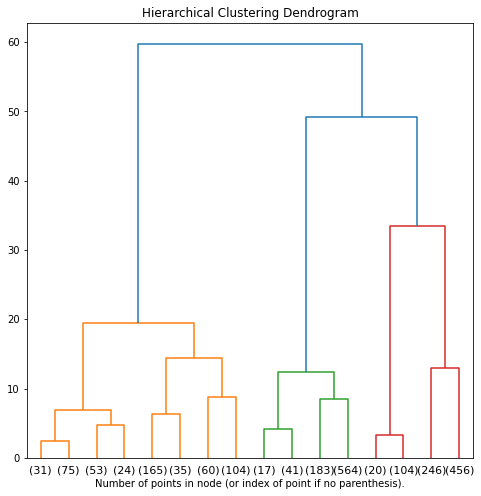

In [ ]:
def plot_dendrogram(model, **kwargs):
    # Create linkage matrix and then plot the dendrogram

    # create the counts of samples under each node
    counts = np.zeros(model.children_.shape[0])
    n_samples = len(model.labels_)
    for i, merge in enumerate(model.children_):
        current_count = 0
        for child_idx in merge:
            if child_idx < n_samples:
                current_count += 1  # leaf node
            else:
                current_count += counts[child_idx - n_samples]
        counts[i] = current_count

    linkage_matrix = np.column_stack(
        [model.children_, model.distances_, counts]
    ).astype(float)

    # Plot the corresponding dendrogram
    dendrogram(linkage_matrix, **kwargs)

# setting distance_threshold=0 ensures we compute the full tree.
model = AgglomerativeClustering(distance_threshold=0, n_clusters=None)

model = model.fit(data_tr[main_cols_tr])
plt.figure(figsize=(8,8))
plt.title("Hierarchical Clustering Dendrogram")
# plot the top three levels of the dendrogram
plot_dendrogram(model, truncate_mode="level", p=3, leaf_font_size=11)
plt.xlabel("Number of points in node (or index of point if no parenthesis).")
plt.show()

# 6. Model with custom distance metric

## 6.1 Metric for distance

Here I constructed a distance metric that takes the coordinates and transform to real km distance between the points, than adds the difference in depth(making it similar to manhattan distance, can be change to euclidean as well). Later the sum is multipied with the coefficient of richter scale differences plus 1 to make it greater than one(as in our data the range of the richter scale results is about 1 overall).

In [ ]:
def user_function_full(p, q):
    coords_1 = (p[0], p[1])
    coords_2 = (q[0], q[1])
    depth_diff = abs(p[2] - q[2])
    richt_diff = abs(p[3] - q[3])
    return (geopy.distance.geodesic(coords_1, coords_2).km + depth_diff)*(1+richt_diff)
metric_full = distance_metric(type_metric.USER_DEFINED, func=user_function_full)

As the earthquakes of different scale can be of the same cluster(having same cause or other relationship), I would not put too much emphasis on the scale, though we can easily do that by exponenting the coeffitient. The depth however is a different story, as there a cluster in the field by scientists of earthquakes by depth, we could even use their clusters, or do a seperate clustering and have multilabel clustering. To increase the importance of depth we just need to multiply it with some scalar k. I will use this specific metric as after some experimenting this one gave the best results.

## 6.2 K-Means with custom distance metric

### Basic K-Means

In [ ]:
initial_centers_in = kmeans_plusplus_initializer(data[main_cols], 8, random_state=seed, ccore=True)
initial_centers = initial_centers_in.initialize()
# instance created for respective distance metric
instanceKm = kmeans(data[main_cols], initial_centers=initial_centers, metric=metric_full)
# perform cluster analysis
instanceKm.process()
# cluster analysis results - clusters and centers
pyClusters = instanceKm.get_clusters()
pyCenters = instanceKm.get_centers()
# enumerate encoding type to index labeling to get labels
pyEncoding = instanceKm.get_cluster_encoding()
pyEncoder = cluster_encoder(pyEncoding, pyClusters, data[main_cols])
cluster_labels = pyEncoder.set_encoding(0).get_clusters()

silhouette_sc = silhouette_score(data[main_cols], cluster_labels, metric=metric_full)
db_sc = davies_bouldin_score(data[main_cols], cluster_labels, metric=metric_full)
ch_sc = calinski_harabasz_score(data[main_cols], cluster_labels, metric=metric_full)
print(
    "For base K-Means",
    "\nThe metrics are",
    "\nSilhouette score is :", silhouette_sc,
    "\nDavies Bouldin score is :", db_sc,
    "\nCalinski Harabasz score is :", ch_sc
)

This is the code of K-Means model with custom distance metric with the use of pyclustering library, the code was working very slow so I will just leave the code here without results. I think as data had a chain form the DBSCAN is the more appropriate learning algorithm.

## 6.3 DBSCAN with custom distance metric

### Base Model

In [ ]:
dbs_clt = DBSCAN(eps=1000, metric=metric_full)
cluster_labels = dbs_clt.fit_predict(data[main_cols])

silhouette_sc = silhouette_score(data[main_cols], cluster_labels, metric=metric_full)
# db_sc = davies_bouldin_score(data[main_cols], cluster_labels, metric=metric_full)
# ch_sc = calinski_harabasz_score(data[main_cols], cluster_labels, metric=metric_full)
print(
    "For base DBSCAN",
    "\nThe metrics are",
    "\nSilhouette score is :", silhouette_sc,
#     "\nDavies Bouldin score is :", db_sc,
#     "\nCalinski Harabasz score is :", ch_sc
)
print(f"Number of clusters: {len(np.unique(cluster_labels))}")

For base DBSCAN 
The metrics are 
Silhouette score is : -0.16503318851989396
Number of clusters: 16


### Hyperparameter Tuning

In [ ]:
%%time

def objective(space):
    params = {
        "min_samples": int(space["min_samples"]),
        "eps": float(space["eps"])
    }

    dbs_clt = DBSCAN(
        **params
    )

    score = silhouette_score(data[main_cols], dbs_clt.fit_predict(data[main_cols]), metric=metric_full)
    print("Silhouette Score {:.3f} params {}".format(score, params))
    return {'loss':1 - score, 'status': STATUS_OK }

space = {
    "min_samples": hp.choice("min_samples", range(7, 25, 3)),
    "eps": hp.choice("min_samples", range(700, 1300, 100))
    }

best = fmin(fn=objective,
            space=space,
            algo=tpe.suggest,
            max_evals=10)

I will not run the hyperparameter tunning cell in this notebook as it takes too long to complete.

In [ ]:
dbs_clt = DBSCAN(eps=1000, min_samples=10, metric=metric_full)
cluster_labels = dbs_clt.fit_predict(data[main_cols])

silhouette_sc = silhouette_score(data[main_cols], cluster_labels, metric=metric_full)
# db_sc = davies_bouldin_score(data[main_cols], cluster_labels, metric=metric_full)
# ch_sc = calinski_harabasz_score(data[main_cols], cluster_labels, metric=metric_full)
print(
    "For base DBSCAN",
    "\nThe metrics are",
    "\nSilhouette score is :", silhouette_sc,
#     "\nDavies Bouldin score is :", db_sc,
#     "\nCalinski Harabasz score is :", ch_sc
)
print(f"Number of clusters: {len(np.unique(cluster_labels))}")

For base DBSCAN 
The metrics are 
Silhouette score is : 0.26051237258624715
Number of clusters: 9


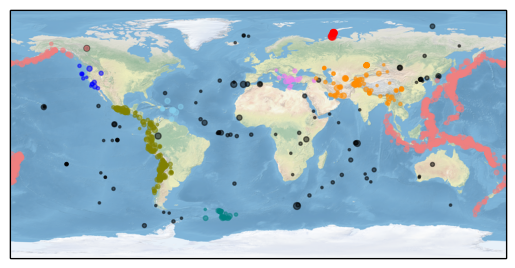

In [ ]:
ax = plt.axes(projection=ccrs.PlateCarree())
ax.stock_img()
clusters = pd.DataFrame(cluster_labels, columns=["results"])

cols = ['lightcoral', 'darkorange', 'olive', 'teal', 'violet', 'skyblue', "red", "blue", "black"]
plt.scatter(x=data.Longitude, y=data.Latitude,
            c=clusters["results"].apply(lambda x: cols[x]),
            s=data_tr.sc__Richter*30,
            alpha=0.5,
            transform=ccrs.PlateCarree())
plt.show()

## 6.5 OPTICS with custom distance metric

### Base Model

In [ ]:
ops_clt = OPTICS(eps=1000, metric=metric_full)
cluster_labels = ops_clt.fit_predict(data[main_cols])

silhouette_sc = silhouette_score(data[main_cols], cluster_labels, metric=metric_full)
# db_sc = davies_bouldin_score(data[main_cols], cluster_labels, metric=metric_full)
# ch_sc = calinski_harabasz_score(data[main_cols], cluster_labels, metric=metric_full)
print(
    "For base DBSCAN",
    "\nThe metrics are",
    "\nSilhouette score is :", silhouette_sc,
#     "\nDavies Bouldin score is :", db_sc,
#     "\nCalinski Harabasz score is :", ch_sc
)
print(f"Number of clusters: {len(np.unique(cluster_labels))}")

For base DBSCAN 
The metrics are 
Silhouette score is : -0.012510195789931192
Number of clusters: 148


### Hyperparameter Tuning

In [ ]:
%%time

def objective(space):
    params = {
        "min_samples": int(space["min_samples"]),
        "eps": float(space["eps"])
    }

    ops_clt = OPTICS(
        **params
    )

    score = silhouette_score(data[main_cols], ops_clt.fit_predict(data[main_cols]), metric=metric_full)
    print("Silhouette Score {:.3f} params {}".format(score, params))
    return {'loss':1 - score, 'status': STATUS_OK }

space = {
    "min_samples": hp.choice("min_samples", range(7, 25, 3)),
    "eps": hp.choice("min_samples", range(700, 1300, 100))
    }

best = fmin(fn=objective,
            space=space,
            algo=tpe.suggest,
            max_evals=10)

I will not run the hyperparameter tunning cell in this notebook as it takes too long to complete.

I was hoping to improve my results with the help of OPTICS algorithm as it is the DBSCAN with elastic eps parameter and I thought it might be useful to devide the big cluster that I got with the DBSCAN. Nevertheless, I was not able to obtain any better results.

# 7. Visualizations

Here I will visualize the results of 3 models, to see how similar the results are.

## 7.1 K-Means

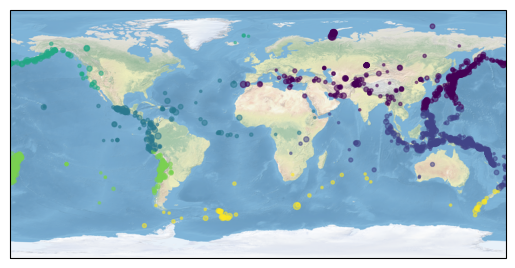

In [ ]:
km_opt_clt = KMeans(n_clusters=6, n_init="auto", random_state=seed, tol=0.0002)
km_opt_clt.fit(data_tr[main_cols_tr])
cluster_labels = km_opt_clt.predict(data_tr[main_cols_tr])
clusters = pd.DataFrame(cluster_labels, columns=["results"])

ax = plt.axes(projection=ccrs.PlateCarree())
ax.stock_img()

plt.scatter(x=data.Longitude, y=data.Latitude,
            c=clusters["results"],
            s=data_tr.sc__Richter*30,
            alpha=0.5,
            transform=ccrs.PlateCarree())
plt.show()

## 7.2 DBSCAN

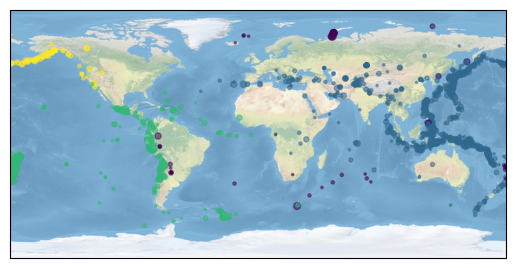

In [ ]:
dbs_clt = DBSCAN(min_samples=21, eps=0.43841)
cluster_labels = dbs_clt.fit_predict(data_tr[main_cols_tr])
clusters = pd.DataFrame(cluster_labels, columns=["results"])

ax = plt.axes(projection=ccrs.PlateCarree())
ax.stock_img()

plt.scatter(x=data.Longitude, y=data.Latitude,
            c=clusters["results"],
            s=data_tr.sc__Richter*30,
            alpha=0.5,
            transform=ccrs.PlateCarree())
plt.show()

## 7.3 Agglomerative

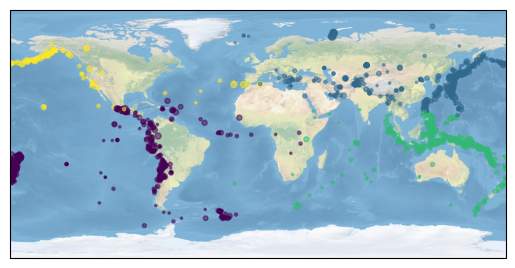

In [ ]:
agg_clt = AgglomerativeClustering(n_clusters=4, linkage='complete')
cluster_labels = agg_clt.fit_predict(data_tr[main_cols_tr])
clusters = pd.DataFrame(cluster_labels, columns=["results"])

ax = plt.axes(projection=ccrs.PlateCarree())
ax.stock_img()

plt.scatter(x=data.Longitude, y=data.Latitude,
            c=clusters["results"],
            s=data_tr.sc__Richter*30,
            alpha=0.5,
            transform=ccrs.PlateCarree())
plt.show()

## 7.4 DBSCAN with custom distance metric

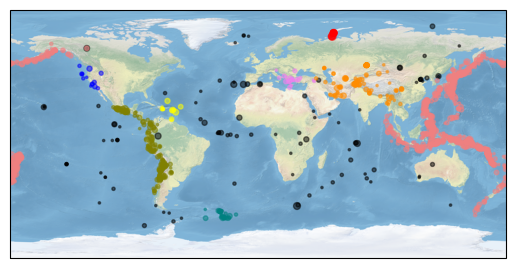

In [ ]:
dbs_clt = DBSCAN(eps=1000, min_samples=10, metric=metric_full)
cluster_labels = dbs_clt.fit_predict(data[main_cols])
ax = plt.axes(projection=ccrs.PlateCarree())
ax.stock_img()
clusters = pd.DataFrame(cluster_labels, columns=["results"])

cols = ['lightcoral', 'darkorange', 'olive', 'teal', 'violet', 'yellow', "red", "blue", "black"]
plt.scatter(x=data.Longitude, y=data.Latitude,
            c=clusters["results"].apply(lambda x: cols[x]),
            s=data_tr.sc__Richter*30,
            alpha=0.5,
            transform=ccrs.PlateCarree())
plt.show()

# 8. Results

To sum up, I think the best performace was achived with the DBSCAN with custom distance metric and you can clearly see that in the visualization on the map. The Agglomerative Clustering also performed quite good with normalized data, and showed a very high Silhouette score. However, the introduced metric was taking into account the coordinates system used and the other 2 parameters, based on the specific issues at hand or wanted clusterizations it can also be easily modified to meet those requirements. Thus, I would choose the DBSCAN with custom distance metric as the best clustering method among those disscussed.

# 9. Additional

Here I left some of the experiments that I was doing to check different hyperparameters visually, this is not part of the formal homework I will just leave it here as part of the work done.

In [ ]:
def user_function_full(p, q):
    coords_1 = (p[0], p[1])
    coords_2 = (q[0], q[1])
    depth_diff = abs(p[2] - q[2])
    richt_diff = abs(p[3] - q[3])
    return (geopy.distance.geodesic(coords_1, coords_2).km + depth_diff)*(1+richt_diff)
metric_full = distance_metric(type_metric.USER_DEFINED, func=user_function_full)

1000 10
       Focal depth     Latitude    Longitude      Richter  predicted_clusters
count  2178.000000  2178.000000  2178.000000  2178.000000         2178.000000
mean     74.359963     7.961997    54.914835     5.977181           14.949036
std     116.467797    30.545583   118.875581     0.189426           19.511952
min       0.000000   -66.490000  -179.960000     5.800000           -1.000000
25%      21.000000   -12.432500   -67.782500     5.800000           -1.000000
50%      39.000000     0.210000   122.100000     5.900000            4.000000
75%      68.000000    36.480000   146.860000     6.100000           31.000000
max     656.000000    78.150000   180.000000     6.900000           59.000000


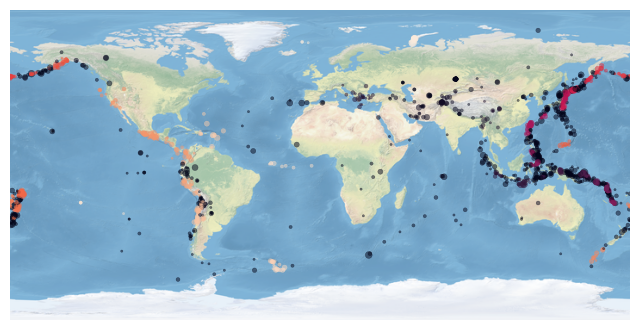

In [ ]:
i = 1000
j = 10
dbs_clt = OPTICS(eps=i, min_samples=j, metric=metric_full)
data["predicted_clusters"] = dbs_clt.fit_predict(data[["Latitude", "Longitude", "Focal depth", "Richter"]])
print(i, j)
print(data.describe())
ax = plt.axes(projection=ccrs.PlateCarree())
ax.stock_img()

plt.scatter(x=data.Longitude, y=data.Latitude,
            c=data["predicted_clusters"]+5,
            s=data_tr.sc__Richter*30,
            alpha=0.5,
            transform=ccrs.PlateCarree())
plt.show()

There exists clustering by the Focal Depth of the earthquake, so theoretically we could just use that. But here I will do analysis just on the data that I have.

In [ ]:
def user_function(p, q, d=0):
    coords_1 = (p[0], p[1])
    coords_2 = (q[0], q[1])
    return geopy.distance.geodesic(coords_1, coords_2).km + d
metric = distance_metric(type_metric.USER_DEFINED, func=user_function)

# create K-Means algorithm with specific distance metric
# Prepare initial centers using K-Means++ method.
#initial_centers = kmeans_plusplus_initializer(data[["Latitude", "Longitude"]], 7).initialize()
#kmeans_instance = kmeans(data[["Latitude", "Longitude"]], initial_centers, metric=metric)
#dbscan_instance = dbscan(data[["Latitude", "Longitude"]].to_numpy(), 10, 5, True, metric=metric)
# dbs_clt = DBSCAN(eps=500, min_samples=30, metric=metric)

# run cluster analysis and obtain results
#kmeans_instance.process()
#dbscan_instance.process()
#data["predicted_clusters"] = kmeans_instance.predict(data[["Latitude", "Longitude"]])
#clusters = dbscan_instance.get_clusters()
# data["predicted_clusters"] = dbs_clt.fit_predict(data[["Latitude", "Longitude"]])

In [ ]:
len(clusters)

16

In [ ]:
results_dict = {}
for i in range(len(clusters)):
    for ind in clusters[i]:
        results_dict[ind] = i
cluster_predict = []
for i in range(1, 2179):
    if i in results_dict:
        cluster_predict.append(results_dict[i])
    else:
        cluster_predict.append(-1)

In [ ]:
data["predicted_clusters"] = cluster_predict

In [ ]:
data.describe()

,Focal depth,Latitude,Longitude,Richter,predicted_clusters
count,2178.000000,2178.000000,2178.000000,2178.000000,2178.000000
mean,74.359963,7.961997,54.914835,5.977181,0.478421
std,116.467797,30.545583,118.875581,0.189426,1.316913
min,0.000000,-66.490000,-179.960000,5.800000,-1.000000
25%,21.000000,-12.432500,-67.782500,5.800000,0.000000
50%,39.000000,0.210000,122.100000,5.900000,0.000000
75%,68.000000,36.480000,146.860000,6.100000,0.000000
max,656.000000,78.150000,180.000000,6.900000,7.000000


In [ ]:
def user_function_full(p, q):
    coords_1 = (p[0], p[1])
    coords_2 = (q[0], q[1])
    depth_diff = abs(p[2] - q[2])
    richt_diff = abs(p[3] - q[3])
    return (geopy.distance.geodesic(coords_1, coords_2).km + depth_diff)*(1+richt_diff)
metric_full = distance_metric(type_metric.USER_DEFINED, func=user_function_full)

1000 10
       Focal depth     Latitude    Longitude      Richter  predicted_clusters
count  2178.000000  2178.000000  2178.000000  2178.000000         2178.000000
mean     74.359963     7.961997    54.914835     5.977181            0.520661
std     116.467797    30.545583   118.875581     0.189426            1.339751
min       0.000000   -66.490000  -179.960000     5.800000           -1.000000
25%      21.000000   -12.432500   -67.782500     5.800000            0.000000
50%      39.000000     0.210000   122.100000     5.900000            0.000000
75%      68.000000    36.480000   146.860000     6.100000            1.000000
max     656.000000    78.150000   180.000000     6.900000            7.000000


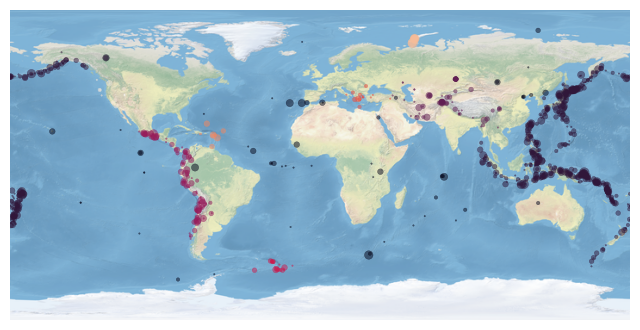

In [ ]:
i = 1000
j = 10
dbs_clt = DBSCAN(eps=i, min_samples=j, metric=metric_full)
data["predicted_clusters"] = dbs_clt.fit_predict(data[["Latitude", "Longitude", "Focal depth", "Richter"]])
print(i, j) # 900 10 # 400 15
print(data.describe())
ax = plt.axes(projection=ccrs.PlateCarree())
ax.stock_img()

plt.scatter(x=data.Longitude, y=data.Latitude,
            c=data["predicted_clusters"]+5,
            s=data_tr.Richter*10,
            alpha=0.5,
            transform=ccrs.PlateCarree())
plt.show()

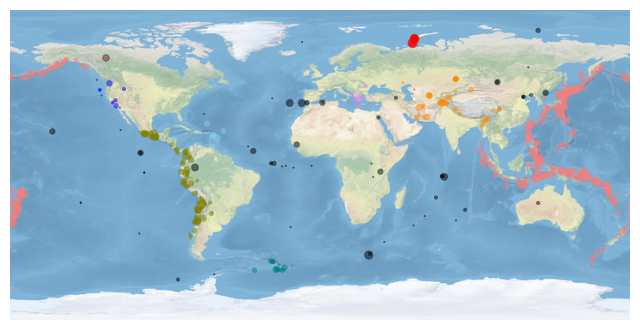

In [ ]:
ax = plt.axes(projection=ccrs.PlateCarree())
ax.stock_img()
cols = ['lightcoral', 'darkorange', 'olive', 'teal', 'violet', 'skyblue', "red", "blue", "black"]
plt.scatter(x=data.Longitude, y=data.Latitude,
            c=data["predicted_clusters"].apply(lambda x: cols[x]),
            s=data_tr.Richter*10,
            alpha=0.5,
            transform=ccrs.PlateCarree())
plt.show()

300 5
       Focal depth     Latitude    Longitude      Richter  predicted_clusters
count  2178.000000  2178.000000  2178.000000  2178.000000         2178.000000
mean     74.359963     7.961997    54.914835     5.977181            3.913223
std     116.467797    30.545583   118.875581     0.189426            6.483526
min       0.000000   -66.490000  -179.960000     5.800000           -1.000000
25%      21.000000   -12.432500   -67.782500     5.800000            0.000000
50%      39.000000     0.210000   122.100000     5.900000            1.000000
75%      68.000000    36.480000   146.860000     6.100000            4.000000
max     656.000000    78.150000   180.000000     6.900000           31.000000


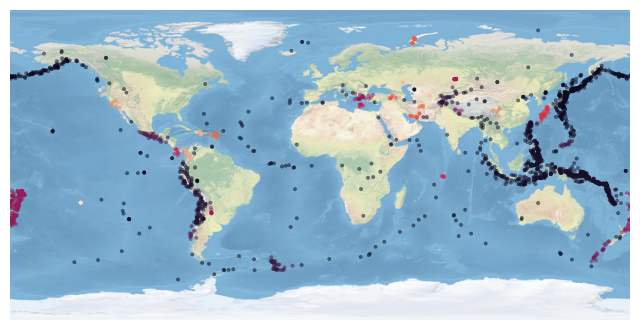

300 10
       Focal depth     Latitude    Longitude      Richter  predicted_clusters
count  2178.000000  2178.000000  2178.000000  2178.000000         2178.000000
mean     74.359963     7.961997    54.914835     5.977181            2.127640
std     116.467797    30.545583   118.875581     0.189426            3.641649
min       0.000000   -66.490000  -179.960000     5.800000           -1.000000
25%      21.000000   -12.432500   -67.782500     5.800000            0.000000
50%      39.000000     0.210000   122.100000     5.900000            1.000000
75%      68.000000    36.480000   146.860000     6.100000            2.000000
max     656.000000    78.150000   180.000000     6.900000           16.000000


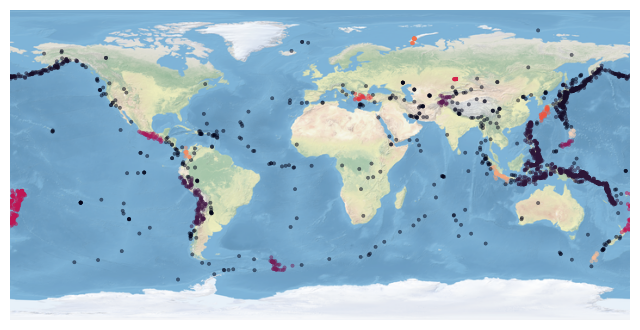

300 15
       Focal depth     Latitude    Longitude      Richter  predicted_clusters
count  2178.000000  2178.000000  2178.000000  2178.000000         2178.000000
mean     74.359963     7.961997    54.914835     5.977181            3.093664
std     116.467797    30.545583   118.875581     0.189426            4.398965
min       0.000000   -66.490000  -179.960000     5.800000           -1.000000
25%      21.000000   -12.432500   -67.782500     5.800000           -1.000000
50%      39.000000     0.210000   122.100000     5.900000            1.000000
75%      68.000000    36.480000   146.860000     6.100000            6.000000
max     656.000000    78.150000   180.000000     6.900000           17.000000


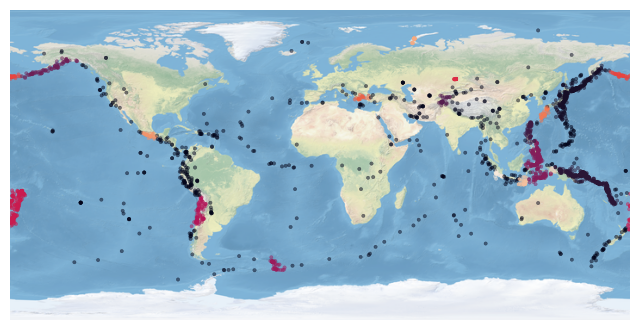

400 5
       Focal depth     Latitude    Longitude      Richter  predicted_clusters
count  2178.000000  2178.000000  2178.000000  2178.000000         2178.000000
mean     74.359963     7.961997    54.914835     5.977181            2.339761
std     116.467797    30.545583   118.875581     0.189426            4.703060
min       0.000000   -66.490000  -179.960000     5.800000           -1.000000
25%      21.000000   -12.432500   -67.782500     5.800000            0.000000
50%      39.000000     0.210000   122.100000     5.900000            0.000000
75%      68.000000    36.480000   146.860000     6.100000            2.000000
max     656.000000    78.150000   180.000000     6.900000           25.000000


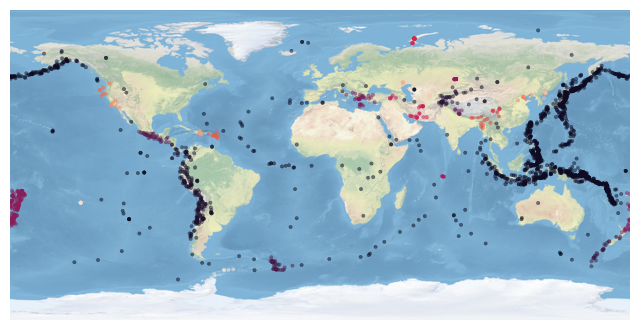

400 10
       Focal depth     Latitude    Longitude      Richter  predicted_clusters
count  2178.000000  2178.000000  2178.000000  2178.000000         2178.000000
mean     74.359963     7.961997    54.914835     5.977181            1.439394
std     116.467797    30.545583   118.875581     0.189426            3.146441
min       0.000000   -66.490000  -179.960000     5.800000           -1.000000
25%      21.000000   -12.432500   -67.782500     5.800000            0.000000
50%      39.000000     0.210000   122.100000     5.900000            0.000000
75%      68.000000    36.480000   146.860000     6.100000            1.000000
max     656.000000    78.150000   180.000000     6.900000           14.000000


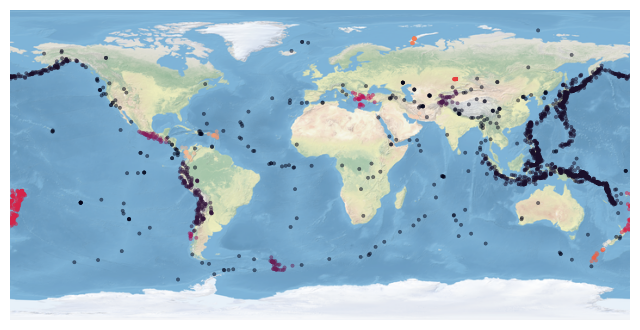

400 15
       Focal depth     Latitude    Longitude      Richter  predicted_clusters
count  2178.000000  2178.000000  2178.000000  2178.000000         2178.000000
mean     74.359963     7.961997    54.914835     5.977181            1.777778
std     116.467797    30.545583   118.875581     0.189426            2.945567
min       0.000000   -66.490000  -179.960000     5.800000           -1.000000
25%      21.000000   -12.432500   -67.782500     5.800000            0.000000
50%      39.000000     0.210000   122.100000     5.900000            1.000000
75%      68.000000    36.480000   146.860000     6.100000            2.000000
max     656.000000    78.150000   180.000000     6.900000           11.000000


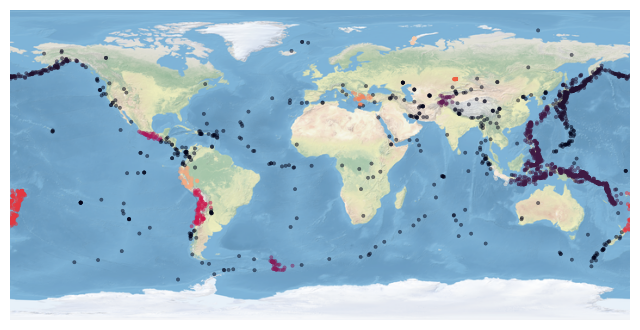

500 5
       Focal depth     Latitude    Longitude      Richter  predicted_clusters
count  2178.000000  2178.000000  2178.000000  2178.000000         2178.000000
mean     74.359963     7.961997    54.914835     5.977181            1.448577
std     116.467797    30.545583   118.875581     0.189426            3.720774
min       0.000000   -66.490000  -179.960000     5.800000           -1.000000
25%      21.000000   -12.432500   -67.782500     5.800000            0.000000
50%      39.000000     0.210000   122.100000     5.900000            0.000000
75%      68.000000    36.480000   146.860000     6.100000            2.000000
max     656.000000    78.150000   180.000000     6.900000           22.000000


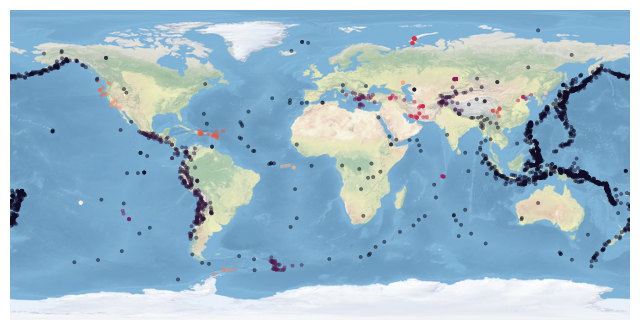

500 10
       Focal depth     Latitude    Longitude      Richter  predicted_clusters
count  2178.000000  2178.000000  2178.000000  2178.000000         2178.000000
mean     74.359963     7.961997    54.914835     5.977181            0.705234
std     116.467797    30.545583   118.875581     0.189426            2.106791
min       0.000000   -66.490000  -179.960000     5.800000           -1.000000
25%      21.000000   -12.432500   -67.782500     5.800000            0.000000
50%      39.000000     0.210000   122.100000     5.900000            0.000000
75%      68.000000    36.480000   146.860000     6.100000            0.000000
max     656.000000    78.150000   180.000000     6.900000           10.000000


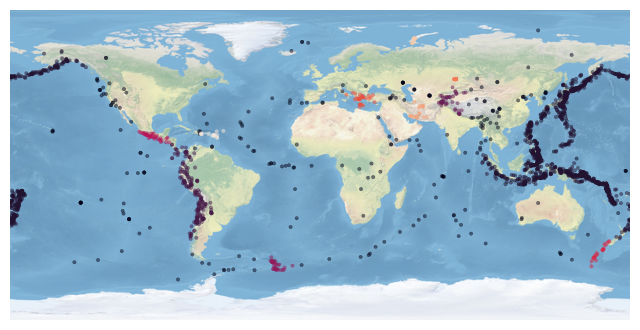

500 15
       Focal depth     Latitude    Longitude      Richter  predicted_clusters
count  2178.000000  2178.000000  2178.000000  2178.000000         2178.000000
mean     74.359963     7.961997    54.914835     5.977181            0.577135
std     116.467797    30.545583   118.875581     0.189426            1.962386
min       0.000000   -66.490000  -179.960000     5.800000           -1.000000
25%      21.000000   -12.432500   -67.782500     5.800000            0.000000
50%      39.000000     0.210000   122.100000     5.900000            0.000000
75%      68.000000    36.480000   146.860000     6.100000            0.000000
max     656.000000    78.150000   180.000000     6.900000           10.000000


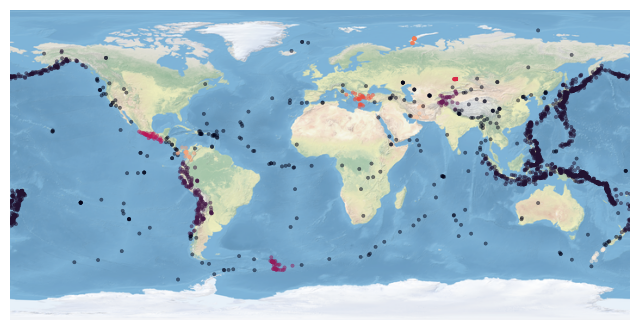

600 5
       Focal depth     Latitude    Longitude      Richter  predicted_clusters
count  2178.000000  2178.000000  2178.000000  2178.000000         2178.000000
mean     74.359963     7.961997    54.914835     5.977181            1.247475
std     116.467797    30.545583   118.875581     0.189426            3.279760
min       0.000000   -66.490000  -179.960000     5.800000           -1.000000
25%      21.000000   -12.432500   -67.782500     5.800000            0.000000
50%      39.000000     0.210000   122.100000     5.900000            0.000000
75%      68.000000    36.480000   146.860000     6.100000            2.000000
max     656.000000    78.150000   180.000000     6.900000           20.000000


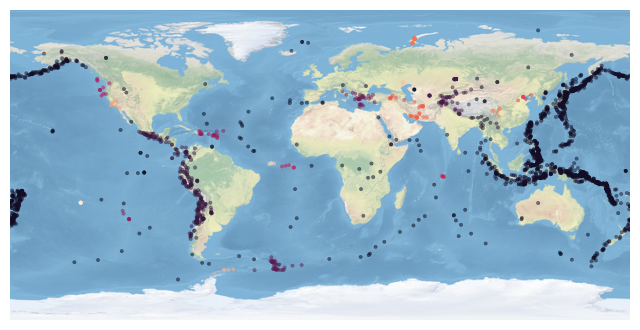

600 10
       Focal depth     Latitude    Longitude      Richter  predicted_clusters
count  2178.000000  2178.000000  2178.000000  2178.000000         2178.000000
mean     74.359963     7.961997    54.914835     5.977181            0.573921
std     116.467797    30.545583   118.875581     0.189426            1.733323
min       0.000000   -66.490000  -179.960000     5.800000           -1.000000
25%      21.000000   -12.432500   -67.782500     5.800000            0.000000
50%      39.000000     0.210000   122.100000     5.900000            0.000000
75%      68.000000    36.480000   146.860000     6.100000            0.000000
max     656.000000    78.150000   180.000000     6.900000           10.000000


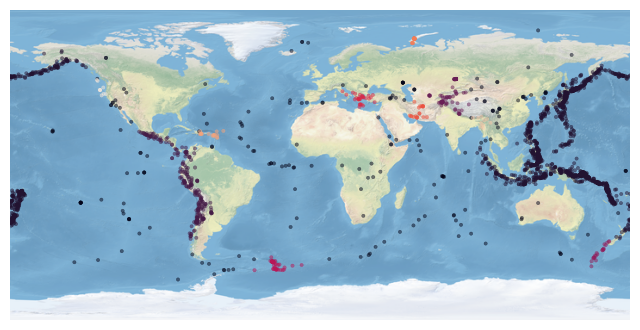

600 15
       Focal depth     Latitude    Longitude      Richter  predicted_clusters
count  2178.000000  2178.000000  2178.000000  2178.000000         2178.000000
mean     74.359963     7.961997    54.914835     5.977181            0.530762
std     116.467797    30.545583   118.875581     0.189426            1.700123
min       0.000000   -66.490000  -179.960000     5.800000           -1.000000
25%      21.000000   -12.432500   -67.782500     5.800000            0.000000
50%      39.000000     0.210000   122.100000     5.900000            0.000000
75%      68.000000    36.480000   146.860000     6.100000            0.000000
max     656.000000    78.150000   180.000000     6.900000            9.000000


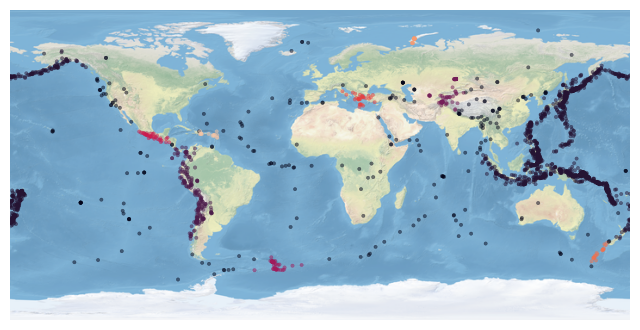

700 5
       Focal depth     Latitude    Longitude      Richter  predicted_clusters
count  2178.000000  2178.000000  2178.000000  2178.000000         2178.000000
mean     74.359963     7.961997    54.914835     5.977181            1.129017
std     116.467797    30.545583   118.875581     0.189426            2.701736
min       0.000000   -66.490000  -179.960000     5.800000           -1.000000
25%      21.000000   -12.432500   -67.782500     5.800000            0.000000
50%      39.000000     0.210000   122.100000     5.900000            0.000000
75%      68.000000    36.480000   146.860000     6.100000            2.000000
max     656.000000    78.150000   180.000000     6.900000           16.000000


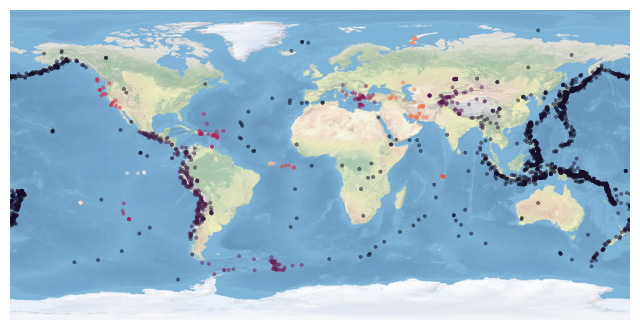

700 10
       Focal depth     Latitude    Longitude      Richter  predicted_clusters
count  2178.000000  2178.000000  2178.000000  2178.000000         2178.000000
mean     74.359963     7.961997    54.914835     5.977181            0.569789
std     116.467797    30.545583   118.875581     0.189426            1.649027
min       0.000000   -66.490000  -179.960000     5.800000           -1.000000
25%      21.000000   -12.432500   -67.782500     5.800000            0.000000
50%      39.000000     0.210000   122.100000     5.900000            0.000000
75%      68.000000    36.480000   146.860000     6.100000            0.000000
max     656.000000    78.150000   180.000000     6.900000            9.000000


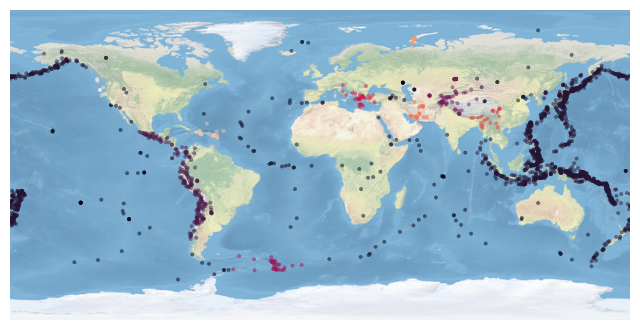

700 15
       Focal depth     Latitude    Longitude      Richter  predicted_clusters
count  2178.000000  2178.000000  2178.000000  2178.000000         2178.000000
mean     74.359963     7.961997    54.914835     5.977181            0.581726
std     116.467797    30.545583   118.875581     0.189426            1.750117
min       0.000000   -66.490000  -179.960000     5.800000           -1.000000
25%      21.000000   -12.432500   -67.782500     5.800000            0.000000
50%      39.000000     0.210000   122.100000     5.900000            0.000000
75%      68.000000    36.480000   146.860000     6.100000            0.000000
max     656.000000    78.150000   180.000000     6.900000            9.000000


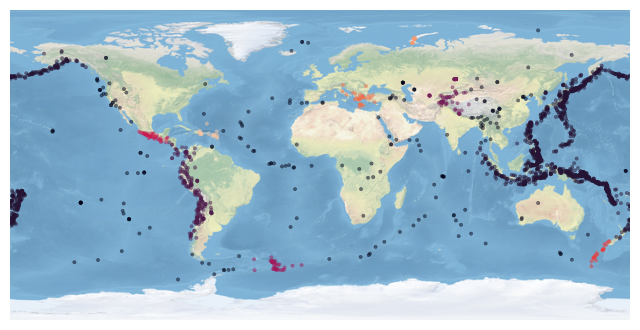

800 5
       Focal depth     Latitude    Longitude      Richter  predicted_clusters
count  2178.000000  2178.000000  2178.000000  2178.000000         2178.000000
mean     74.359963     7.961997    54.914835     5.977181            0.823691
std     116.467797    30.545583   118.875581     0.189426            2.097125
min       0.000000   -66.490000  -179.960000     5.800000           -1.000000
25%      21.000000   -12.432500   -67.782500     5.800000            0.000000
50%      39.000000     0.210000   122.100000     5.900000            0.000000
75%      68.000000    36.480000   146.860000     6.100000            1.000000
max     656.000000    78.150000   180.000000     6.900000           14.000000


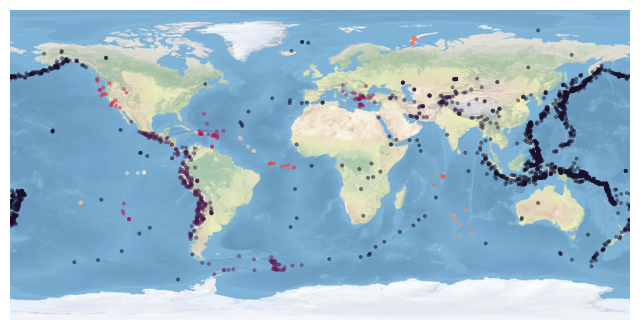

800 10
       Focal depth     Latitude    Longitude      Richter  predicted_clusters
count  2178.000000  2178.000000  2178.000000  2178.000000         2178.000000
mean     74.359963     7.961997    54.914835     5.977181            0.523875
std     116.467797    30.545583   118.875581     0.189426            1.341069
min       0.000000   -66.490000  -179.960000     5.800000           -1.000000
25%      21.000000   -12.432500   -67.782500     5.800000            0.000000
50%      39.000000     0.210000   122.100000     5.900000            0.000000
75%      68.000000    36.480000   146.860000     6.100000            1.000000
max     656.000000    78.150000   180.000000     6.900000            7.000000


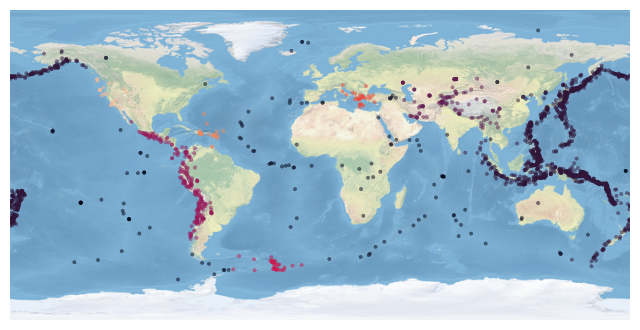

800 15
       Focal depth     Latitude    Longitude      Richter  predicted_clusters
count  2178.000000  2178.000000  2178.000000  2178.000000         2178.000000
mean     74.359963     7.961997    54.914835     5.977181            0.510101
std     116.467797    30.545583   118.875581     0.189426            1.497859
min       0.000000   -66.490000  -179.960000     5.800000           -1.000000
25%      21.000000   -12.432500   -67.782500     5.800000            0.000000
50%      39.000000     0.210000   122.100000     5.900000            0.000000
75%      68.000000    36.480000   146.860000     6.100000            0.000000
max     656.000000    78.150000   180.000000     6.900000            8.000000


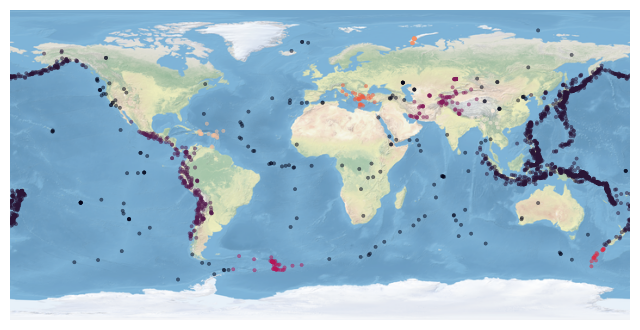

900 5
       Focal depth     Latitude    Longitude      Richter  predicted_clusters
count  2178.000000  2178.000000  2178.000000  2178.000000         2178.000000
mean     74.359963     7.961997    54.914835     5.977181            0.591368
std     116.467797    30.545583   118.875581     0.189426            2.052852
min       0.000000   -66.490000  -179.960000     5.800000           -1.000000
25%      21.000000   -12.432500   -67.782500     5.800000            0.000000
50%      39.000000     0.210000   122.100000     5.900000            0.000000
75%      68.000000    36.480000   146.860000     6.100000            0.000000
max     656.000000    78.150000   180.000000     6.900000           15.000000


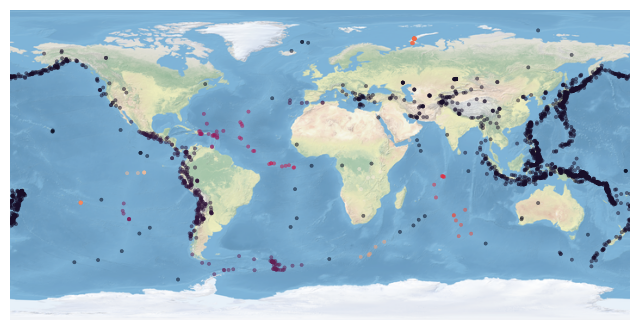

900 10
       Focal depth     Latitude    Longitude      Richter  predicted_clusters
count  2178.000000  2178.000000  2178.000000  2178.000000         2178.000000
mean     74.359963     7.961997    54.914835     5.977181            0.532140
std     116.467797    30.545583   118.875581     0.189426            1.331959
min       0.000000   -66.490000  -179.960000     5.800000           -1.000000
25%      21.000000   -12.432500   -67.782500     5.800000            0.000000
50%      39.000000     0.210000   122.100000     5.900000            0.000000
75%      68.000000    36.480000   146.860000     6.100000            1.000000
max     656.000000    78.150000   180.000000     6.900000            7.000000


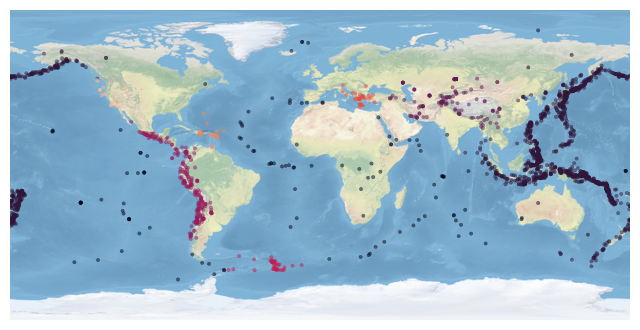

900 15
       Focal depth     Latitude    Longitude      Richter  predicted_clusters
count  2178.000000  2178.000000  2178.000000  2178.000000         2178.000000
mean     74.359963     7.961997    54.914835     5.977181            0.434343
std     116.467797    30.545583   118.875581     0.189426            1.177244
min       0.000000   -66.490000  -179.960000     5.800000           -1.000000
25%      21.000000   -12.432500   -67.782500     5.800000            0.000000
50%      39.000000     0.210000   122.100000     5.900000            0.000000
75%      68.000000    36.480000   146.860000     6.100000            0.000000
max     656.000000    78.150000   180.000000     6.900000            6.000000


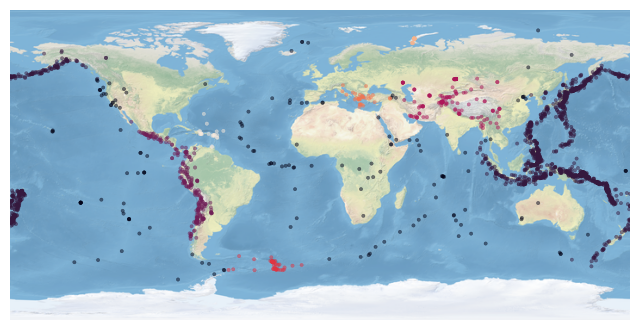

In [ ]:
for i in range(300, 1000, 100):
    for j in range(5, 17, 5):
        dbs_clt = DBSCAN(eps=i, min_samples=j, metric=metric)
        data["predicted_clusters"] = dbs_clt.fit_predict(data[["Latitude", "Longitude"]])
        print(i, j) # 900 10 # 400 15
        print(data.describe())
        ax = plt.axes(projection=ccrs.PlateCarree())
        ax.stock_img()

        plt.scatter(x=data.Longitude, y=data.Latitude,
                    c=data["predicted_clusters"]+5,
                    s=data.Richter,
                    alpha=0.5,
                    transform=ccrs.PlateCarree())
        plt.show()

Performed clustering much better on 2 clusters than it was done by the K-Means with 2 centroids. Further, I will procced to hyperparameter tunning, and I will use the K-Means optimal algorithm results as ground truth, as mentioned in the homework.